# K-Means Clustering (Cyclists)

### Data Mining Project 2024/25

Authors: Nicola Emmolo, Simone Marzeddu, Jacopo Raffi

This notebook study the application of the K-Means clustering algorithm on cyclists data.

The approach below includes in the clustering process the 7 features `mean_cyclist_cp` (climb power), `mean_delta`, `mean_position`, `birth_year`, `height`, `weight` and `cyclist_bmi`.

The selection of these features was derived from a data understanding process, applied following the data cleaning and feature engeneering phases, through which it was possible to skim the attributes by identifying those that appeared to be the most significant. In particular, thanks to the data representation process (applying UMAP and PCA) these feature emerged as the most "aligned" with the principal components.

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import numpy as np

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import seaborn as sns

import itertools

from math import pi

In [4]:
cyclists_dataset = pd.read_csv('../../data/cyclists_dataset_no_outliers.csv')
cyclists_dataset = cyclists_dataset.select_dtypes(include=['number'])
cyclists_dataset = cyclists_dataset.dropna().reset_index(drop=True)

cyclists_dataset.info()
columns_to_use = cyclists_dataset.columns

# Standardizzazione dei dati
scaler = StandardScaler()
data_scaled = scaler.fit_transform(cyclists_dataset)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2778 entries, 0 to 2777
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   mean_cyclist_cp  2778 non-null   float64
 1   mean_delta       2778 non-null   float64
 2   mean_position    2778 non-null   float64
 3   birth_year       2778 non-null   int64  
 4   weight           2778 non-null   float64
 5   height           2778 non-null   float64
 6   cyclist_bmi      2778 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 152.0 KB


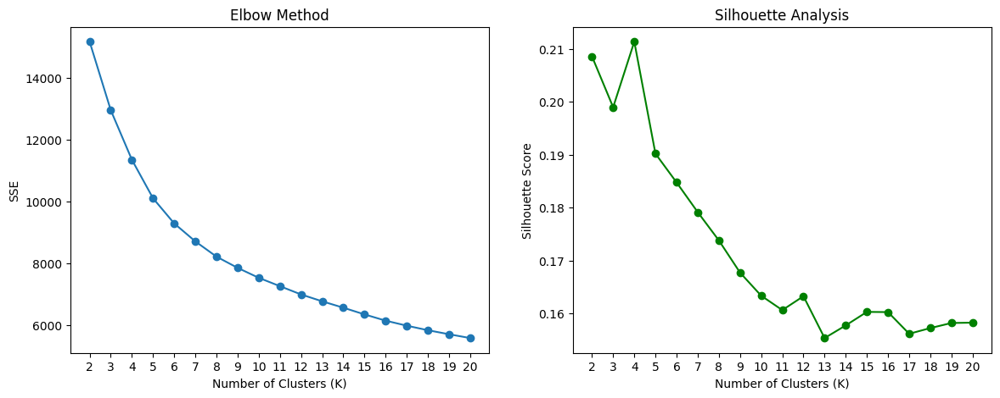

In [5]:
sse_list = []
silhouette_scores = []
max_k = 20

for k in range(2, max_k + 1):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100, random_state=42)
    kmeans.fit(data_scaled)
    sse_list.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data_scaled, kmeans.labels_))


# Visualizzazione del metodo del gomito
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, max_k + 1), sse_list, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.xticks(range(2, max_k+1))
plt.ylabel('SSE')
plt.title('Elbow Method')

# Visualizzazione del Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(range(2, max_k + 1), silhouette_scores, marker='o', color='green')
plt.xlabel('Number of Clusters (K)')
plt.xticks(range(2, max_k+1))
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis')
plt.show()

For the determination of the optimal number of clusters, we considered both the Elbow Method and the Silhouette Score. By analyzing both metrics, we observed that the most suitable number of clusters for our dataset is 4. This choice balances the compactness and separation of the clusters, expecting meaningful and interpretable results.

In [6]:
# Applicazione del K-Means
n_clusters = 4  # Puoi modificare il numero di cluster
kmeans = KMeans(n_clusters=n_clusters, n_init=10, max_iter=100, random_state=42)
kmeans.fit(data_scaled)

KMeans(max_iter=100, n_clusters=4, n_init=10, random_state=42)

In [7]:
# Etichette dei cluster e centroidi
cluster_labels = kmeans.labels_
centers = kmeans.cluster_centers_

# Aggiunta delle etichette al dataset originale
cyclists_dataset['cluster'] = cluster_labels

# Calcolo punteggi di valutazione
print(f"SSE (Sum of Squared Errors): {kmeans.inertia_}")
print(f"Silhouette Score: {silhouette_score(data_scaled, cluster_labels)}")


SSE (Sum of Squared Errors): 11350.401323909908
Silhouette Score: 0.21139434716165054


#### 2D Clusters

In [22]:
def plot_variable_pairs(columns_to_use, dataset):
    # Creazione di tutte le combinazioni di coppie di variabili
    pairs = list(itertools.combinations(columns_to_use, 2))
    n_pairs = len(pairs)

    # Dimensione della griglia (calcolata in base al numero di coppie)
    n_cols = 2  # Numero di colonne nella griglia
    n_rows = int(np.ceil(n_pairs / n_cols))  # Numero di righe nella griglia

    # Creazione della griglia di subplot
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Se c'è una sola riga di subplot, axes sarà un array 1D; uniformiamo la struttura.
    if n_rows == 1:
        axes = axes[np.newaxis, :]

    # Convert columns_to_use to a list
    columns_to_use_list = list(columns_to_use)

    # Plot per ogni coppia di variabili
    for (x_var, y_var), ax in zip(pairs, axes.ravel()):
        sns.scatterplot(
            data=dataset,
            x=x_var, y=y_var, hue="cluster", palette="viridis", ax=ax, s=10
        )
        ax.scatter(
            scaler.inverse_transform(centers)[:, columns_to_use_list.index(x_var)],
            scaler.inverse_transform(centers)[:, columns_to_use_list.index(y_var)],
            s=200, c='red', marker='*', label='Centroids'
        )
        ax.set_title(f'Clusters: {x_var} vs {y_var}')
        ax.legend()

    # Rimuovi subplot vuoti se n_pairs non riempie la griglia
    for ax in axes.ravel()[n_pairs:]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()

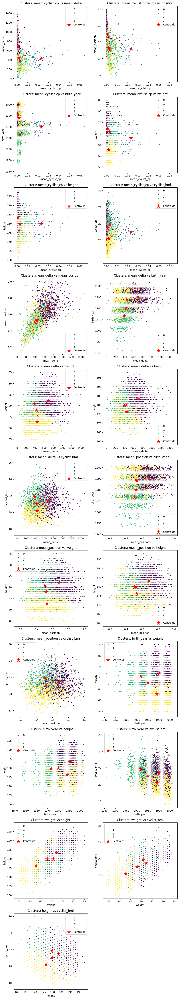

In [23]:
# Esempio di utilizzo della funzione
plot_variable_pairs(columns_to_use, cyclists_dataset)

#### 3D Clusters

In [24]:
def plot_variable_triplets(columns_to_use, dataset):
    # Creazione di tutte le combinazioni di triplette di variabili
    triplets = list(itertools.combinations(columns_to_use, 3))
    n_triplets = len(triplets)

    # Dimensione della griglia (calcolata in base al numero di triplette)
    n_cols = 2  # Numero di colonne nella griglia
    n_rows = int(np.ceil(n_triplets / n_cols))  # Numero di righe nella griglia

    # Creazione della griglia di subplot
    fig = plt.figure(figsize=(14, 7 * n_rows))

    # Convert columns_to_use to a list
    columns_to_use_list = list(columns_to_use)

    # Plot per ogni combinazione di tre variabili
    for i, (x_var, y_var, z_var) in enumerate(triplets):
        ax = fig.add_subplot(n_rows, n_cols, i + 1, projection='3d')

        # Scatterplot dei dati
        ax.scatter(
            dataset[x_var],
            dataset[y_var],
            dataset[z_var],
            c=dataset["cluster"], cmap="viridis", s=10, zorder=1
        )

        # Scatterplot dei centroidi
        for center in scaler.inverse_transform(centers):  # Itera su ogni centroide
            ax.scatter(
            center[columns_to_use_list.index(x_var)],
            center[columns_to_use_list.index(y_var)],
            center[columns_to_use_list.index(z_var)],
            s=200, c='red', marker='*', zorder=2
            )

        # Titolo e etichette
        ax.set_title(f'Clusters: {x_var} vs {y_var} vs {z_var}', pad=20)
        ax.set_xlabel(x_var)
        ax.set_ylabel(y_var)
        ax.set_zlabel(z_var)

    # Imposta layout per evitare sovrapposizioni
    plt.tight_layout()
    plt.show()

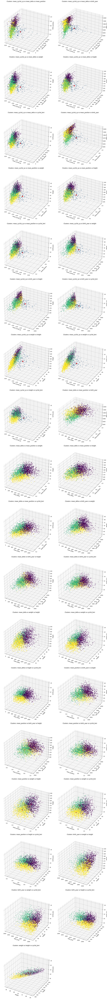

In [25]:
plot_variable_triplets(columns_to_use, cyclists_dataset)

#### Last Results

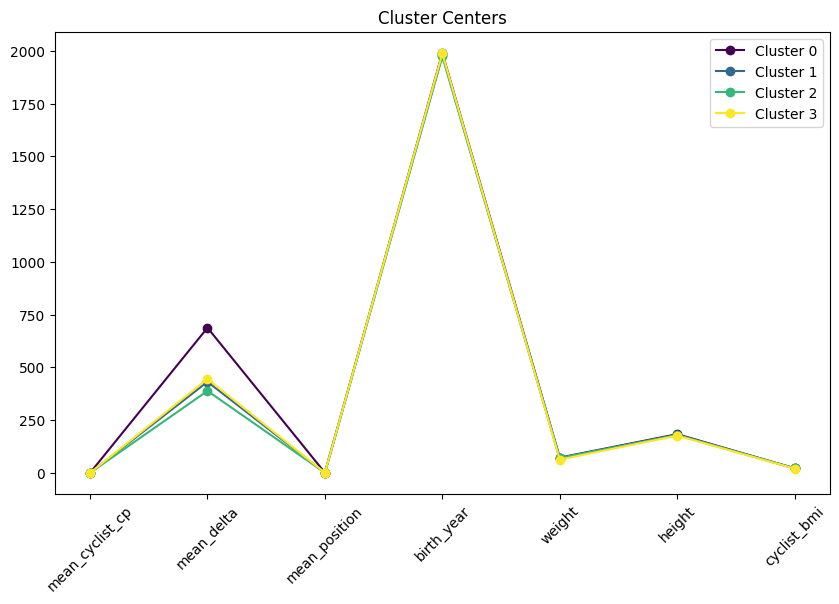

In [32]:
# Centroidi riportati alle scale originali
centers_original = scaler.inverse_transform(centers)
colors = plt.cm.viridis(np.linspace(0, 1, len(centers_original)))
# Visualizzazione parallela dei centroidi
plt.figure(figsize=(10, 6))
for i in range(len(centers_original)):
    plt.plot(centers_original[i], marker='o', label=f'Cluster {i}', c=colors[i])
plt.xticks(range(len(columns_to_use)), columns_to_use, rotation=45)
plt.title('Cluster Centers')
plt.legend()
plt.show()


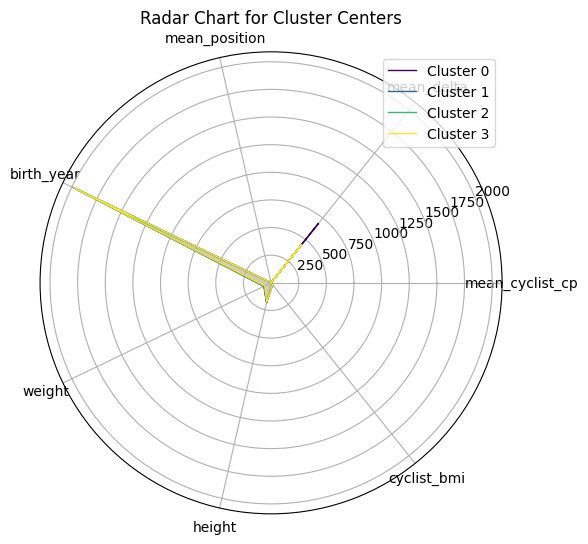

In [35]:
N = len(columns_to_use)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]
# Radar Chart per ogni cluster
plt.figure(figsize=(10, 6))
for i, center in enumerate(centers_original):
    values = center.tolist()
    values += values[:1]
    ax = plt.subplot(111, polar=True)
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f'Cluster {i}', c=colors[i])
    ax.fill(angles, values, alpha=0.1)

plt.xticks(angles[:-1], columns_to_use)
plt.title('Radar Chart for Cluster Centers')
plt.legend()
plt.show()


In [28]:
centroid_df = pd.DataFrame(centers_original, columns=columns_to_use)
centroid_df

,mean_cyclist_cp,mean_delta,mean_position,birth_year,weight,height,cyclist_bmi
0,0.000923,687.547820,0.685363,1990.418762,72.148743,183.330754,21.471263
1,0.023334,431.399167,0.522460,1980.063158,68.042105,179.852632,21.027066
2,0.002793,388.249421,0.503425,1973.383866,70.803060,179.796940,21.905673
3,0.001945,445.073991,0.531560,1988.096774,62.775484,176.326882,20.199268


To understand which features best define the clusters, we analyzed the 2D and 3D plots. By examining the values of the features and the centroids, we identified the key characteristics that differentiate the clusters. This analysis helps in interpreting the clustering results and understanding the underlying patterns in the data. Specifically, we observed that `mean_cyclist_cp`, `weight`, and `mean_delta` are the features with the highest correlation to the cluster separation.

In particular:
- **Cluster 0 (purple)**, is identifiable from a medium-high `mean_delta`, medium-high `weight`, low `mean_cyclist_cp`
- **Cluster 1 (blue)**, is identifiable from a medium-high `mean_cyclist_cp`
- **Cluster 2 (green)**, is identifiable from a low `mean_delta`, medium-high `weight`, low `mean_cyclist_cp`
- **Cluster 3 (yellow)**, is identifiable from a medium-low `mean_delta`, low `weight`, low `mean_cyclist_cp`

Almast all clusters have very low values of `mean_cyclist_cp`, but cluster 1 is the only one with these medium-high values.
For the other three clusters, what further differentiates them are the values of `mean_delta` and `weight`.